In [7]:
import pandas as pd
import plotly.graph_objects as go

# URL of the airports dataset
url = "https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat"

# Load the airports dataset
airports = pd.read_csv(url, header=None)

# Assign column names to the airports DataFrame
airports.columns = ['AirportID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']

# Load your flight routes dataset
df = pd.read_csv("Consumer_Airfare_Report__Table_1a_-_All_U.S._Airport_Pair_Markets_20240712.csv", low_memory=False)

# Merge to get origin airport coordinates
merged_df = df.merge(airports[['IATA', 'Latitude', 'Longitude']], left_on='airport_1', right_on='IATA', how='left')
merged_df = merged_df.rename(columns={'Latitude': 'Origin_Latitude', 'Longitude': 'Origin_Longitude'})
merged_df = merged_df.drop('IATA', axis=1)

# Merge to get destination airport coordinates
merged_df = merged_df.merge(airports[['IATA', 'Latitude', 'Longitude']], left_on='airport_2', right_on='IATA', how='left')
merged_df = merged_df.rename(columns={'Latitude': 'Destination_Latitude', 'Longitude': 'Destination_Longitude'})
merged_df = merged_df.drop('IATA', axis=1)

# Ensure you have a 'PassengerDensity' or similar column
# Here, we'll assume that such a column exists and represents the density of passengers at each airport

# Define the range of years
start_year = 2020
end_year = 2023



In [8]:
# Filter the DataFrame for the required years
filtered_df = merged_df[(merged_df['Year'] >= start_year) & (merged_df['Year'] <= end_year)]
# Normalizing counts to map to color scale.

filtered_df['normalized_passengers'] = (filtered_df['passengers'] - filtered_df['passengers'].min()) / (filtered_df['passengers'].max() - filtered_df['passengers'].min())
# display(filtered_df)

# Define the color scale range for passenger density
cmin = filtered_df['normalized_passengers'].min()
cmax = filtered_df['normalized_passengers'].quantile(0.9)  # Adjust the upper range to 95th percentile to reduce the range
print(cmin)
print(cmax)
cmean = filtered_df['normalized_passengers'].mean()
print(cmean)

0.0
0.12648764113518463
0.046682160908009314


/var/folders/31/j8brlprs43dckltwtk_z9r480000gn/T/ipykernel_94324/1116099269.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



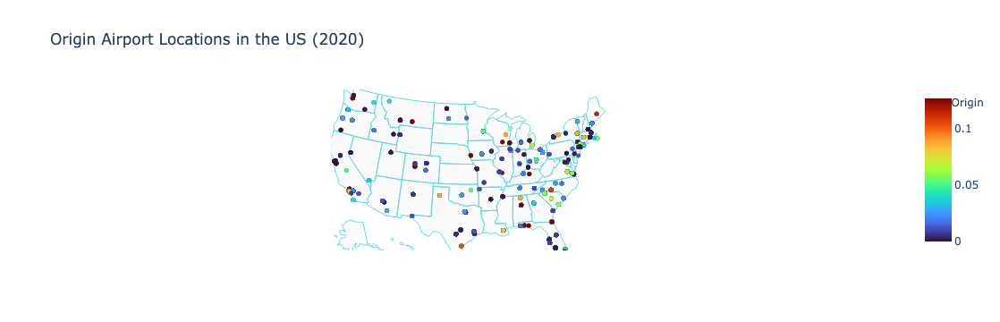

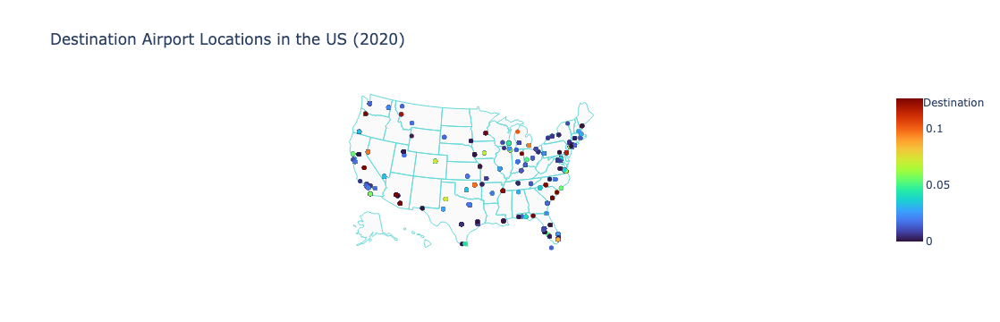

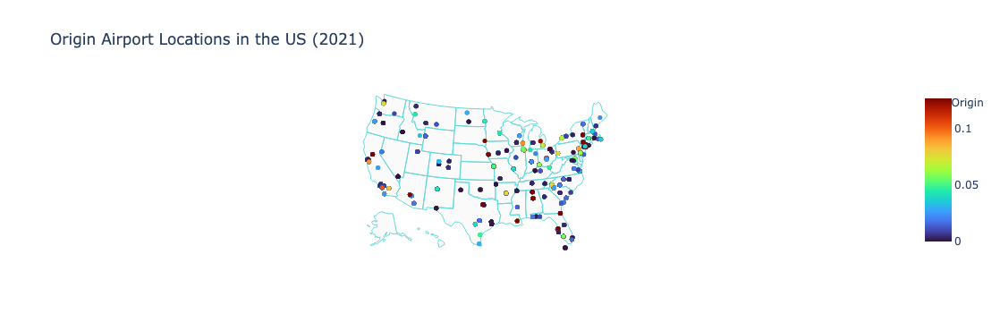

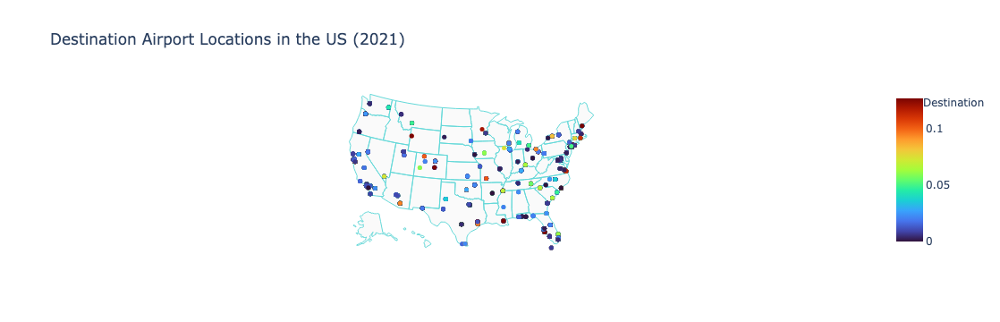

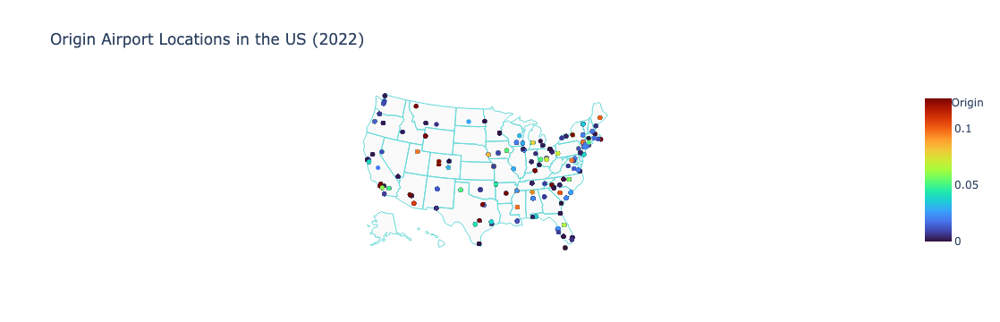

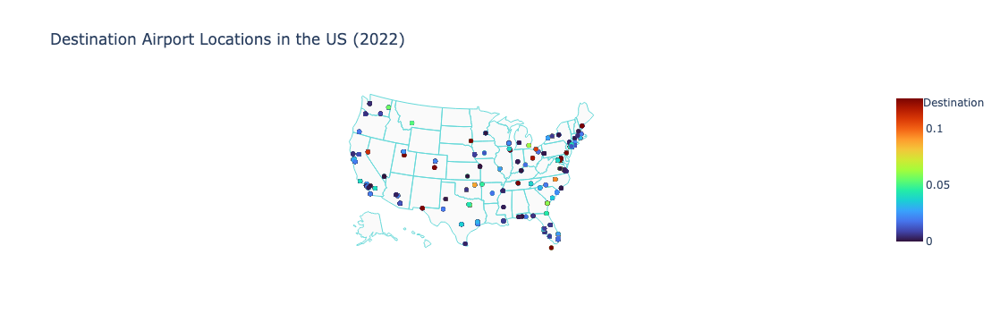

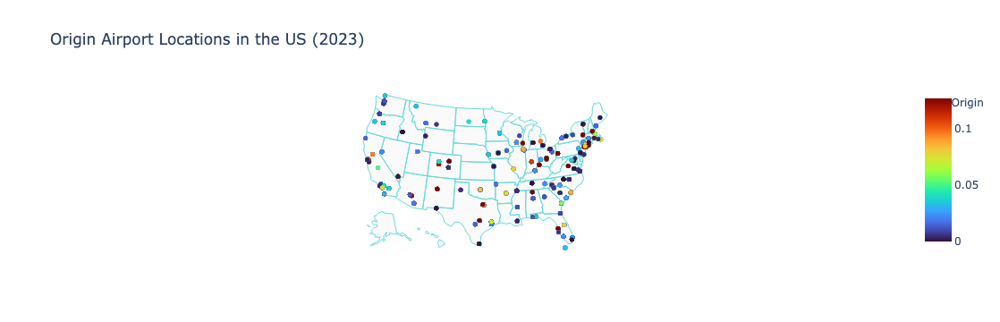

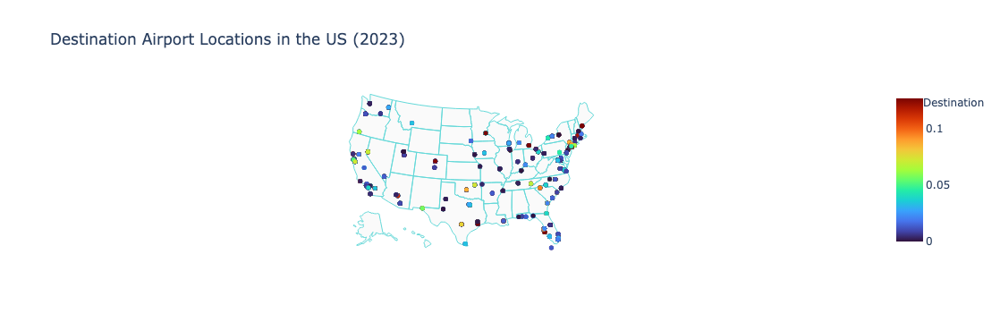

In [9]:
# Loop through each year and create separate scatter plots for origins and destinations
for year in range(start_year, end_year + 1):
    yearly_data = filtered_df[filtered_df['Year'] == year]
    
    # Plot for origin airports
    fig_origin = go.Figure()
    
    fig_origin.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = yearly_data['Origin_Longitude'],
        lat = yearly_data['Origin_Latitude'],
        hoverinfo = 'text',
        text = yearly_data['airport_1'],
        mode = 'markers',
        marker = dict(
            size = 5,
            color = filtered_df['normalized_passengers'],  # Use the PassengerDensity column for color
            colorscale = 'Turbo',
            cmin = cmin,
            cmax = cmax,
            showscale = True
        ),
        name='Origin'
    ))
    
    fig_origin.update_layout(
        title = f'Origin Airport Locations in the US ({year})',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            projection_type = 'albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(100, 217, 217)",
            countrycolor = "rgb(217, 100, 217)",
            lataxis = dict(range=[20, 50]),
            lonaxis = dict(range=[-130, -60]),
        ),
    )
    
    fig_origin.show()
    
    # Plot for destination airports
    fig_destination = go.Figure()
    
    fig_destination.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = yearly_data['Destination_Longitude'],
        lat = yearly_data['Destination_Latitude'],
        hoverinfo = 'text',
        text = yearly_data['airport_2'],
        mode = 'markers',
        marker = dict(
            size = 5,
            color = filtered_df['normalized_passengers'],  # Use the PassengerDensity column for color
            colorscale = 'Turbo',
            cmin = cmin,
            cmax = cmax,
            showscale = True
        ),
        name='Destination'
    ))
    
    fig_destination.update_layout(
        title = f'Destination Airport Locations in the US ({year})',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            projection_type = 'albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(100, 217, 217)",
            countrycolor = "rgb(217, 100, 217)",
            lataxis = dict(range=[20, 50]),
            lonaxis = dict(range=[-130, -60]),
        ),
    )
    
    fig_destination.show()